In [ ]:
# Libraries used
import os
from google.colab import files
from PIL import Image  # For image processing
from runpy import run_path
from tqdm import tqdm
from glob import glob
from natsort import natsorted
import shutil
from collections import OrderedDict

import numpy as np
import matplotlib.pyplot as plt
import math

import cv2
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF

import skimage
from skimage import restoration, util, data
from skimage.restoration import denoise_tv_chambolle
from skimage import metrics
from skimage.metrics import peak_signal_noise_ratio
from skimage.metrics import mean_squared_error
from skimage import img_as_float, img_as_ubyte

# Introduction: What is an image denoiser?
An image denoiser is a tool or algorithm (computer vision technique) that removes unwanted noise from an image, resulting in enhancing image quality. We can clean up the picture by eliminating grainy spots, discoloration, or other visual disturbances while attempting to preserve the important details of the image itself. It is a important part of image porcessing and computer vision.

In [ ]:
# Connect the google colab notebook to google drive before creating pdf
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
folder_path = '/content/drive/My Drive/Colab Notebooks/ComputerImaging/Project Image Denoise++/test_images'

# Download images from Kodak dataset (For train set)

In [ ]:
# Base URL with a placeholder for the number
base_url = "https://r0k.us/graphics/kodak/kodak/kodim{:02d}.png"

for i in range(11, 25):
    url = base_url.format(i)  # Format the URL with the current number
    !wget {url}

--2025-02-10 23:20:04--  https://r0k.us/graphics/kodak/kodak/kodim11.png
Resolving r0k.us (r0k.us)... 185.151.30.215, 2a07:7800::215
Connecting to r0k.us (r0k.us)|185.151.30.215|:443... connected.
HTTP request sent, awaiting response... 200 
Length: 621023 (606K) [image/png]
Saving to: ‘kodim11.png’

kodim11.png         100%[===================>] 606.47K   889KB/s    in 0.7s    

2025-02-10 23:20:05 (889 KB/s) - ‘kodim11.png’ saved [621023/621023]

--2025-02-10 23:20:06--  https://r0k.us/graphics/kodak/kodak/kodim12.png
Resolving r0k.us (r0k.us)... 185.151.30.215, 2a07:7800::215
Connecting to r0k.us (r0k.us)|185.151.30.215|:443... connected.
HTTP request sent, awaiting response... 200 
Length: 531024 (519K) [image/png]
Saving to: ‘kodim12.png’

kodim12.png         100%[===================>] 518.58K   795KB/s    in 0.7s    

2025-02-10 23:20:07 (795 KB/s) - ‘kodim12.png’ saved [531024/531024]

--2025-02-10 23:20:07--  https://r0k.us/graphics/kodak/kodak/kodim13.png
Resolving r0k.us (r0k

In [ ]:
import cv2
import numpy as np

# Initialize a dictionary to store the images
clean_train = {}
noisy_train = {}

# Loop through image numbers from 11 to 24
for i in range(11, 25):
    # Construct the filename
    filename = f'kodim{i:02d}.png'

    # Load the image
    clean_image = cv2.imread(filename)  # Ground truth image

    if clean_image is None:
        print(f"Warning: Unable to load {filename}. Skipping.")
        continue  # Skip if the image cannot be loaded

    # Convert from BGR to RGB
    clean_image = clean_image[:, :, ::-1]

    # Convert into a floating-point array
    clean_image = clean_image.astype('float')

    # Normalize the image
    clean_image_normalized = clean_image / 255
    clean_image_normalized = np.clip(clean_image_normalized, 0, 1)

    # Store the normalized image in the dictionary
    clean_train[filename] = clean_image_normalized

    # Add Gaussian noise with standard deviation = 0.1
    noisy_image = clean_image_normalized + 0.1 * np.random.randn(*clean_image_normalized.shape)
    noisy_image = np.clip(noisy_image, 0, 1)

    # Store the noisy image in the noisy_train dictionary
    noisy_train[filename] = noisy_image

    print(f"Processed and added noise to {filename}")


Processed and added noise to kodim11.png
Processed and added noise to kodim12.png
Processed and added noise to kodim13.png
Processed and added noise to kodim14.png
Processed and added noise to kodim15.png
Processed and added noise to kodim16.png
Processed and added noise to kodim17.png
Processed and added noise to kodim18.png
Processed and added noise to kodim19.png
Processed and added noise to kodim20.png
Processed and added noise to kodim21.png
Processed and added noise to kodim22.png
Processed and added noise to kodim23.png
Processed and added noise to kodim24.png


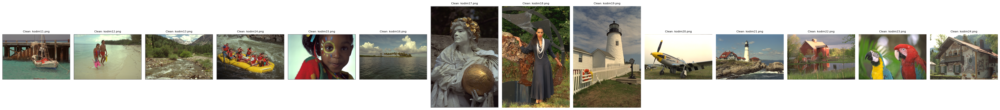

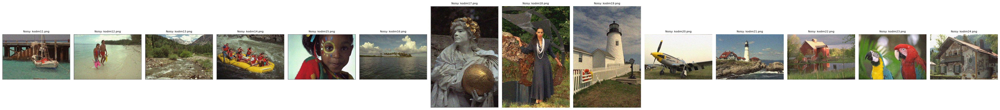

In [ ]:
import matplotlib.pyplot as plt

def display_images_in_one_row(clean_images, noisy_images):
    """
    Display all clean images in one row and all noisy images in another row.
    """
    # Helper function to display a single row of images
    def display_row(images, title):
        num_images = len(images)
        fig, ax = plt.subplots(1, num_images, figsize=(3 * num_images, 5))
        if num_images == 1:
            ax = [ax]  # Handle case with one image

        # Sort keys to maintain order
        image_keys = sorted(images.keys())

        for idx, filename in enumerate(image_keys):
            img = images[filename]
            ax[idx].imshow(img)
            ax[idx].set_title(f"{title}: {filename}", fontsize=8)
            ax[idx].axis("off")

        plt.tight_layout()
        plt.show()

    # Display all clean images in one row
    display_row(clean_images, "Clean")

    # Display all noisy images in one row
    display_row(noisy_images, "Noisy")

# Display all clean images in one row, then all noisy images in one row
display_images_in_one_row(clean_train, noisy_train)


# Upload test images using OpenCV

In [ ]:
def load_images_from_folder(folder_path):
    images = []
    for file_name in os.listdir(folder_path):
        # Ensure we only load .png
        if file_name.endswith(('.png')):
            file_path = os.path.join(folder_path, file_name)
            # Open the image
            img = Image.open(file_path)
            images.append((file_name, img))
    return images

In [ ]:
# Load all images
test_images = load_images_from_folder(folder_path)
print(f"Loaded {len(test_images)} images.")

Loaded 20 images.


# Method
Before picking up which algorithms to use, I came up with an idea that I might try two algorithms, bilateral filter and the other one. I found that TV Chambolle algorithm is similar to Bilateral filter (both use Gaussian noise) but speed is faster. And it is used a lot for general purpose edge preserving denoising, so I chose trying Bilateral filter and TV Chambolle.


### How did I find the optimal denoiser parameters?


Used Kodak dataset's images from #11 to #24 as train set.

denoise_bilateral:

In [ ]:
import skimage
from skimage import img_as_float, restoration, util

# Initialize variables to store the best results
best_avg_mse = float('inf')
best_avg_psnr = float('-inf')
best_params = {}
best_filename = None

# Define parameter ranges
win_sizes = [3, 5, 7, 11]  # Window sizes to test
sigma_colors = [0.01, 0.1, 0.2]  # Sigma_color values to test
sigma_spatials = [1, 3, 5, 7, 10]


# Perform grid search over parameters
for win_size in win_sizes:
    for sigma_color in sigma_colors:
        for sigma_spatial in sigma_spatials:
            total_mse = 0
            total_psnr = 0
            num_images = len(clean_train)  # Total number of images

            # Loop through each image in the dataset
            for filename in clean_train:
                clean_image = np.array(clean_train[filename])
                noisy_image = np.array(noisy_train[filename])

                # Convert the images to float
                noisy_image = img_as_float(noisy_image)
                clean_image = img_as_float(clean_image)

                denoised = restoration.denoise_bilateral(
                    noisy_image,
                    win_size=win_size,
                    sigma_color=sigma_color,
                    sigma_spatial=sigma_spatial,
                    channel_axis=-1,
                )

                # Compute MSE and PSNR
                mse = skimage.metrics.mean_squared_error(clean_image, denoised)
                psnr = skimage.metrics.peak_signal_noise_ratio(clean_image, denoised)

                total_mse += mse
                total_psnr += psnr

            # Compute average metrics for this parameter set
            avg_mse = total_mse / num_images
            avg_psnr = total_psnr / num_images

            # Update the best parameters if this set performs better
            if avg_mse < best_avg_mse or (avg_mse == best_avg_mse and avg_psnr > best_avg_psnr):
                best_avg_mse = avg_mse
                best_avg_psnr = avg_psnr
                best_params = {"win_size": win_size, "sigma_color":sigma_color, "sigma_spatial": sigma_spatial}

# Display the results
print(f"Best MSE: {best_avg_mse:.6f}")
print(f"Best PSNR: {best_avg_psnr:.2f} dB")
print(f"Best Parameters: {best_params}")

Best MSE: 0.001641
Best PSNR: 28.05 dB
Best Parameters: {'win_size': 5, 'sigma_color': 0.1, 'sigma_spatial': 10}


denoise_nl_mean

* h: the filter strength for noise attenuation. larger values remove more noise but smooth image details
* patch_size: the size of the patches used for comparison (only odd integer)
* patch_distance: the max dist to search for similar patches

In [ ]:
import skimage
from skimage import restoration, img_as_float
import numpy as np

# Initialize variables to store the overall best results
best_avg_mse = float('inf')
best_avg_psnr = float('-inf')
best_params = {}

# Define parameter ranges
h_values = [0.1, 0.3, 0.5, 0.7, 1.0]  # Filter strengths
patches = [3, 5, 7]  # Valid integer values for patch distance
fast_modes = [True, False]


# Perform grid search over parameters
for patch in patches:
    for h in h_values:
        for fast_mode in fast_modes:
                total_mse = 0
                total_psnr = 0
                num_images = len(clean_train)  # Total number of images

                # Loop through each image in the dataset
                for filename in clean_train:
                    clean_image = np.array(clean_train[filename])
                    noisy_image = np.array(noisy_train[filename])

                    # Convert the images to float
                    noisy_image = img_as_float(noisy_image)
                    clean_image = img_as_float(clean_image)

                    # Apply NL Means denoising
                    denoised = restoration.denoise_nl_means(
                        noisy_image,
                        patch_size=patch,
                        patch_distance=patch,
                        h=h,
                        fast_mode=fast_mode,
                        channel_axis=-1,  # Set for color images
                    )

                    # Compute MSE and PSNR
                    mse = skimage.metrics.mean_squared_error(clean_image, denoised)
                    psnr = skimage.metrics.peak_signal_noise_ratio(clean_image, denoised)

                    total_mse += mse
                    total_psnr += psnr

                # Compute average metrics for this parameter set
                avg_mse = total_mse / num_images
                avg_psnr = total_psnr / num_images

                # Update the best parameters if this set performs better
                if avg_mse < best_avg_mse or (avg_mse == best_avg_mse and avg_psnr > best_avg_psnr):
                    best_avg_mse = avg_mse
                    best_avg_psnr = avg_psnr
                    best_params = {"patch_size": patch, "patch_distance":patch, "h": h, "fast_mode": fast_mode}

# Display the overall best results
print(f"Best Average MSE: {best_avg_mse:.6f}")
print(f"Best Average PSNR: {best_avg_psnr:.2f} dB")
print(f"Best Parameters: {best_params}")


Best Average MSE: 0.001396
Best Average PSNR: 28.81 dB
Best Parameters: {'patch_size': 5, 'patch_distance': 5, 'h': 0.1, 'fast_mode': False}


Try different method: tv_chambolle

Find the best parameter set for the image 07

In [ ]:
# Define the hyperparameters to try
weight_values = [0.1, 0.2, 0.5, 1.0, 2.0]
n_iter_max = [100, 200, 300, 400, 500]
eps = [0.0001, 0.001]

# Initialize variables to store the best results
best_avg_mse = float('inf')
best_avg_psnr = float('-inf')
best_params = {}

# Experiment with different hyperparameter combinations
for weight in weight_values:
    for max_iter in n_iter_max:
        for ep in eps:

            # Process each pair of clean and noisy images
            for filename in clean_train:
                clean_image = np.array(clean_train[filename])
                noisy_image = np.array(noisy_train[filename])

                # Convert the images to float
                noisy_image = img_as_float(noisy_image)
                clean_image = img_as_float(clean_image)

                # Denoise the noisy image using current hyperparameters
                denoised = denoise_tv_chambolle(noisy_image,
                                                      weight=weight,
                                                      max_num_iter = max_iter,
                                                      eps = ep)

                # Calculate the MSE and PSNR
                mse = metrics.mean_squared_error(clean_image, denoised)
                psnr = metrics.peak_signal_noise_ratio(clean_image, denoised)

                total_mse += mse
                total_psnr += psnr

            # Compute average metrics for this parameter set
            avg_mse = total_mse / num_images
            avg_psnr = total_psnr / num_images

            # If the current MSE is the best, update the best parameters
            if mse < best_avg_mse or (mse == best_avg_mse and psnr > best_avg_psnr):
                best_avg_mse = mse
                best_avg_psnr = psnr
                best_params = {'weight': weight, 'max_num_iter': max_iter, 'eps': ep}

# Display the overall best results
print(f"Best Average MSE: {best_avg_mse:.6f}")
print(f"Best Average PSNR: {best_avg_psnr:.2f} dB")
print(f"Best Parameters: {best_params}")

Best Average MSE: 0.003245
Best Average PSNR: 24.89 dB
Best Parameters: {'weight': 0.1, 'max_num_iter': 100, 'eps': 0.001}


denoise_wavelet

* wavelet: The wavelet function to use (e.g., 'haar', 'db1', 'db2', 'sym2').
* level: The level of decomposition for wavelet transform.
* method: The denoising method (e.g., 'BayesShrink', 'VisuShrink').
* mode: The boundary extension method (e.g., 'soft', 'hard').
* rescale_sigma: Whether or not to rescale the noise standard deviation.

In [ ]:
import skimage
from skimage import restoration, img_as_float
import numpy as np
import pywt

# Initialize variables to store the overall best results
best_avg_mse = float('inf')
best_avg_psnr = float('-inf')
best_params = {}

# Define parameter ranges for wavelet denoising
wavelets = ['haar', 'db1', 'db2', 'sym2', 'sym9']  # Wavelet types
methods = ['BayesShrink', 'VisuShrink']  # Denoising methods
modes = ['soft', 'hard']  # Boundary extension methods
rescale_sigmas = [True, False]  # Whether to rescale sigma

# Perform grid search over parameters
for wavelet in wavelets:
    for method in methods:
        for mode in modes:
            for rescale_sigma in rescale_sigmas:
                total_mse = 0
                total_psnr = 0
                num_images = len(clean_train)  # Total number of images

                # Process each pair of clean and noisy images
                for filename in clean_train:
                    clean_image = np.array(clean_train[filename])
                    noisy_image = np.array(noisy_train[filename])

                    # Convert the images to float
                    noisy_image = img_as_float(noisy_image)
                    clean_image = img_as_float(clean_image)

                    # Apply Wavelet denoising
                    denoised = restoration.denoise_wavelet(
                        noisy_image,
                        wavelet=wavelet,
                        method=method,
                        mode=mode,
                        rescale_sigma=rescale_sigma,
                    )

                    # Compute MSE and PSNR
                    mse = skimage.metrics.mean_squared_error(clean_image, denoised)
                    psnr = skimage.metrics.peak_signal_noise_ratio(clean_image, denoised)

                    total_mse += mse
                    total_psnr += psnr

                # Compute average metrics for this parameter set
                avg_mse = total_mse / num_images
                avg_psnr = total_psnr / num_images

                # Update the best parameters if this set performs better
                if avg_mse < best_avg_mse or (avg_mse == best_avg_mse and avg_psnr > best_avg_psnr):
                    best_avg_mse = avg_mse
                    best_avg_psnr = avg_psnr
                    best_params = {"wavelet": wavelet, "method": method, "mode": mode, "rescale_sigma": rescale_sigma}

# Display the overall best results
print(f"Best Average MSE: {best_avg_mse:.6f}")
print(f"Best Average PSNR: {best_avg_psnr:.2f} dB")
print(f"Best Parameters: {best_params}")


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 1 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Best Average MSE: 0.003365
Best Average PSNR: 24.82 dB
Best Parameters: {'wavelet': 'sym2', 'method': 'VisuShrink', 'mode': 'hard', 'rescale_sigma': True}


From above with train images (Image 11 - Image 24), I got the best MSE when win_size is 5, sigma_color is 0.1, and sigma_spatial is 10. I assume this will be best for all of the images, and apply this parameter set to all of the images to calculate average MSE.

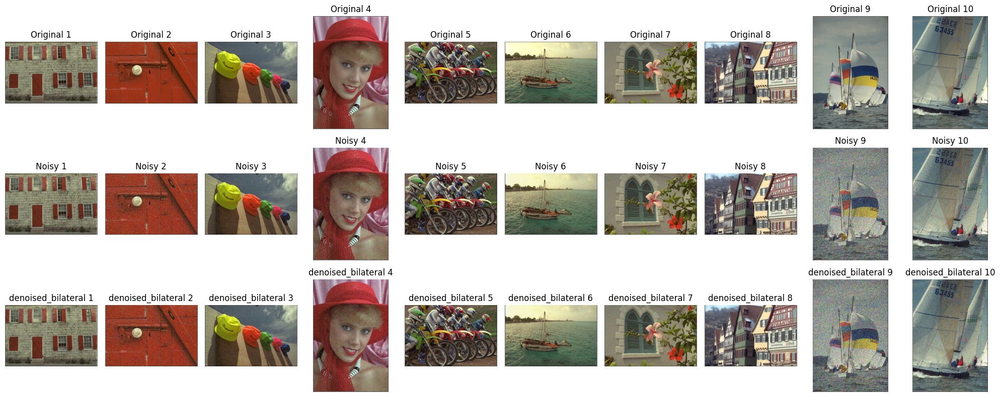

Image 1: RMSE = 0.055506
Image 2: RMSE = 0.088067
Image 3: RMSE = 0.035388
Image 4: RMSE = 0.044406
Image 5: RMSE = 0.042908
Image 6: RMSE = 0.043069
Image 7: RMSE = 0.032231
Image 8: RMSE = 0.046908
Image 9: RMSE = 0.233296
Image 10: RMSE = 0.057953
denoise_bilateral Average MSE: 0.007878
denoise_bilateral Average RMSE: 0.067973
denoise_bilateral Average PSNR: 25.07 dB


In [ ]:
# Create a directory in Google Drive to save the images
save_dir = "/content/drive/My Drive/Colab Notebooks/ComputerImaging/denoised_images_bilateral"
os.makedirs(save_dir, exist_ok=True)

# Initialize variables to store the best results
best_mse = float('inf')
best_psnr = float('-inf')
best_params = {}

# Define the best parameter set
win_size = 5  # Window sizes to test
sigma_color = 0.1  # Sigma_color values to test
sigma_spatial = 10

# Error metrics
rmse_list = []
mse_list = []
psnr_list = []

# Plot and save the noisy and denoised image pair
fig, axs = plt.subplots(3, 10, figsize=(20, 8))  # Three rows: original, noisy, denoised

# Apply the best parameters for each of the 10 images
for i in range(1, 11):
    noisy_image_name = f"noisy_{i:02}.png"  # Use 02 for 2-digit formatting
    clean_image_name = f"orig_{i:02}.png"

    # Find the noisy image and clean image from the images array
    noisy_image = next(img for name, img in test_images if name == noisy_image_name)
    clean_image = next(img for name, img in test_images if name == clean_image_name)

    # Before applying the algorithm, need to convert the image to a numpy array
    noisy_image = np.array(noisy_image)
    clean_image = np.array(clean_image)

    # Convert the images to float
    noisy_image = img_as_float(noisy_image)
    clean_image = img_as_float(clean_image)

    denoised = restoration.denoise_bilateral(
        noisy_image,
        win_size=win_size,
        sigma_color=sigma_color,
        sigma_spatial=sigma_spatial,
        channel_axis=-1,
    )

    mse = metrics.mean_squared_error(clean_image, denoised)
    rmse = np.sqrt(mse)  # RMSE = sqrt(MSE)
    psnr = metrics.peak_signal_noise_ratio(clean_image, denoised)

    mse_list.append(mse)
    rmse_list.append(rmse)
    psnr_list.append(psnr)

    # Plot the images in three rows
    axs[0, i - 1].imshow(clean_image)
    axs[0, i - 1].set_title(f"Original {i}")
    axs[0, i - 1].axis("off")

    axs[1, i - 1].imshow(noisy_image)
    axs[1, i - 1].set_title(f"Noisy {i}")
    axs[1, i - 1].axis("off")

    axs[2, i - 1].imshow(denoised)
    axs[2, i - 1].set_title(f"denoised_bilateral {i}")
    axs[2, i - 1].axis("off")

# Adjust layout
plt.tight_layout()
plt.savefig(os.path.join(save_dir, "all_images_results_bilateral.png"))
plt.show()

# Compute average MSE, RMSE, and PSNR over all 10 images
avg_mse = np.mean(mse_list)
avg_rmse = np.mean(rmse_list)
avg_psnr = np.mean(psnr_list)

# Display the results
for i in range(1, 11):
    # Display RMSE for each image
    print(f"Image {i}: RMSE = {rmse_list[i-1]:.6f}")
print(f"denoise_bilateral Average MSE: {avg_mse:.6f}")
print(f"denoise_bilateral Average RMSE: {avg_rmse:.6f}")
print(f"denoise_bilateral Average PSNR: {avg_psnr:.2f} dB")

Apply with denoise_nl_means

From above, we get best minimum average when h is 0.1, patch_size and patch_distance is 5, and fast_mode is False. Use these parameter to apply to test images.

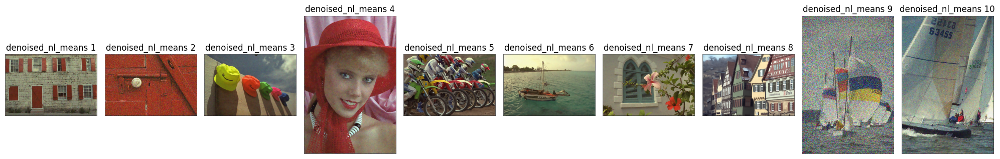

Image 1: RMSE = 0.060383
Image 2: RMSE = 0.182067
Image 3: RMSE = 0.032701
Image 4: RMSE = 0.056465
Image 5: RMSE = 0.036806
Image 6: RMSE = 0.036185
Image 7: RMSE = 0.028097
Image 8: RMSE = 0.035080
Image 9: RMSE = 0.318489
Image 10: RMSE = 0.111174
denoise_nl_means Average MSE: 0.015953
denoise_nl_means Average RMSE: 0.089745
denoise_nl_means Average PSNR: 24.05 dB


In [ ]:
save_dir = "/content/drive/My Drive/Colab Notebooks/ComputerImaging/denoised_images_nl_means"
os.makedirs(save_dir, exist_ok=True)

# Initialize variables to store the best results
best_mse = float('inf')
best_psnr = float('-inf')
best_params = {}

# Define the best parameter set
h = 0.1
patch_size = 5
patch_distance = 5
fast_mode = False

# Error metrics
rmse_list = []
mse_list = []
psnr_list = []

# Plot and save only denoised images
fig, axs = plt.subplots(1, 10, figsize=(20, 4))

# Apply the best parameters for each of the 10 images
for i in range(1, 11):
    noisy_image_name = f"noisy_{i:02}.png"  # Use 02 for 2-digit formatting
    clean_image_name = f"orig_{i:02}.png"

    # Find the noisy image and clean image from the images array
    noisy_image = next(img for name, img in test_images if name == noisy_image_name)
    clean_image = next(img for name, img in test_images if name == clean_image_name)

    # Convert the images to float
    noisy_image = img_as_float(noisy_image)
    clean_image = img_as_float(clean_image)

    # Apply NL Means denoising
    denoised = restoration.denoise_nl_means(
        noisy_image,
        patch_size=patch_size,
        patch_distance=patch_distance,
        h=h,
        fast_mode=fast_mode,
        channel_axis=-1,  # Set for color images
    )

    # Calculate the MSE and PSNR
    mse = metrics.mean_squared_error(clean_image, denoised)
    rmse = np.sqrt(mse)  # RMSE = sqrt(MSE)
    psnr = metrics.peak_signal_noise_ratio(clean_image, denoised)

    mse_list.append(mse)
    rmse_list.append(rmse)
    psnr_list.append(psnr)

    # Plot the denoised image
    axs[i - 1].imshow(denoised)
    axs[i - 1].set_title(f"denoised_nl_means {i}")
    axs[i - 1].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(save_dir, f"denoised_images_results_nl_means.png"))
plt.show()

# Compute average MSE, RMSE, and PSNR over all 10 images
avg_mse = np.mean(mse_list)
avg_rmse = np.mean(rmse_list)
avg_psnr = np.mean(psnr_list)

# Display the results
for i in range(1, 11):
    # Display RMSE for each image
    print(f"Image {i}: RMSE = {rmse_list[i-1]:.6f}")
print(f"denoise_nl_means Average MSE: {avg_mse:.6f}")
print(f"denoise_nl_means Average RMSE: {avg_rmse:.6f}")
print(f"denoise_nl_means Average PSNR: {avg_psnr:.2f} dB")

Apply with denoise_tv_chambolle

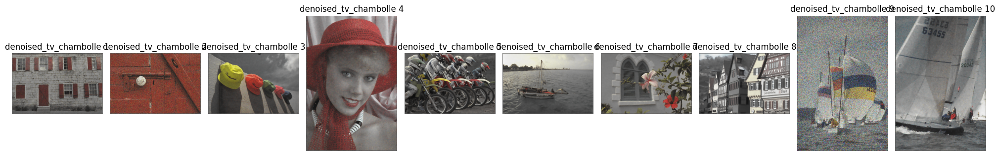

Image 1: RMSE = 0.071403
Image 2: RMSE = 0.105725
Image 3: RMSE = 0.060291
Image 4: RMSE = 0.068586
Image 5: RMSE = 0.069456
Image 6: RMSE = 0.071602
Image 7: RMSE = 0.057661
Image 8: RMSE = 0.071301
Image 9: RMSE = 0.139741
Image 10: RMSE = 0.045536
denoise_tv_chambolle Average MSE: 0.006458
denoise_tv_chambolle Average RMSE: 0.076130
denoise_tv_chambolle Average PSNR: 22.78 dB


In [ ]:
save_dir = "/content/drive/My Drive/Colab Notebooks/ComputerImaging/denoised_images_tv_chambolle"
os.makedirs(save_dir, exist_ok=True)

# Initialize variables to store the best results
best_mse = float('inf')
best_psnr = float('-inf')
best_params = {}

# Define the best parameter set
weight = 0.1
max_num_iter = 100
eps = 0.0001

# Error metrics
rmse_list = []
mse_list = []
psnr_list = []

# Plot and save only denoised images
fig, axs = plt.subplots(1, 10, figsize=(20, 4))

# Apply the best parameters for each of the 10 images
for i in range(1, 11):
    noisy_image_name = f"noisy_{i:02}.png"  # Use 02 for 2-digit formatting
    clean_image_name = f"orig_{i:02}.png"

    # Find the noisy image and clean image from the images array
    noisy_image = next(img for name, img in test_images if name == noisy_image_name)
    clean_image = next(img for name, img in test_images if name == clean_image_name)

    # Convert the images to float
    noisy_image = img_as_float(noisy_image)
    clean_image = img_as_float(clean_image)


    # Denoise the noisy image using current hyperparameters
    denoised = denoise_tv_chambolle(noisy_image,
                                          weight=weight,
                                          max_num_iter = max_num_iter,
                                          eps = eps)

    # Calculate the MSE and PSNR
    mse = metrics.mean_squared_error(clean_image, denoised)
    rmse = np.sqrt(mse)  # RMSE = sqrt(MSE)
    psnr = metrics.peak_signal_noise_ratio(clean_image, denoised)

    mse_list.append(mse)
    rmse_list.append(rmse)
    psnr_list.append(psnr)

    # Plot the denoised image
    axs[i - 1].imshow(denoised)
    axs[i - 1].set_title(f"denoised_tv_chambolle {i}")
    axs[i - 1].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(save_dir, f"denoised_images_results_tv_chambolle.png"))
plt.show()

# Compute average MSE, RMSE, and PSNR over all 10 images
avg_mse = np.mean(mse_list)
avg_rmse = np.mean(rmse_list)
avg_psnr = np.mean(psnr_list)

# Display the results
for i in range(1, 11):
    # Display RMSE for each image
    print(f"Image {i}: RMSE = {rmse_list[i-1]:.6f}")
print(f"denoise_tv_chambolle Average MSE: {avg_mse:.6f}")
print(f"denoise_tv_chambolle Average RMSE: {avg_rmse:.6f}")
print(f"denoise_tv_chambolle Average PSNR: {avg_psnr:.2f} dB")

Apply with denoise_wavelet

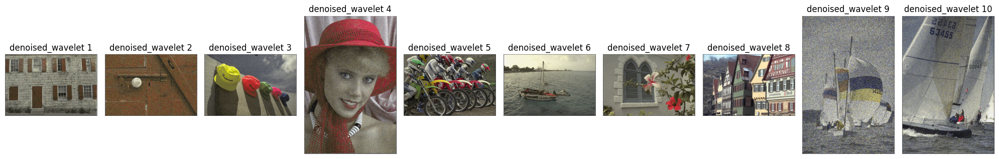

Image 1: RMSE = 0.074198
Image 2: RMSE = 0.147270
Image 3: RMSE = 0.061324
Image 4: RMSE = 0.084218
Image 5: RMSE = 0.043106
Image 6: RMSE = 0.052294
Image 7: RMSE = 0.049456
Image 8: RMSE = 0.012651
Image 9: RMSE = 0.123916
Image 10: RMSE = 0.065221
denoise_tv_chambolle Average MSE: 0.006485
denoise_tv_chambolle Average RMSE: 0.071365
denoise_tv_chambolle Average PSNR: 24.38 dB


In [ ]:
save_dir = "/content/drive/My Drive/Colab Notebooks/ComputerImaging/denoised_images_wavelet"
os.makedirs(save_dir, exist_ok=True)

# Initialize variables to store the best results
best_mse = float('inf')
best_psnr = float('-inf')
best_params = {}

# Define the best parameter set
wavelet = 'sym2'
method = 'VisuShrink'
mode = 'hard'
rescale_sigma = True

# Error metrics
rmse_list = []
mse_list = []
psnr_list = []

# Plot and save only denoised images
fig, axs = plt.subplots(1, 10, figsize=(20, 4))  # One row: denoised images

# Apply the best parameters for each of the 10 images
for i in range(1, 11):
    noisy_image_name = f"noisy_{i:02}.png"  # Use 02 for 2-digit formatting
    clean_image_name = f"orig_{i:02}.png"

    # Find the noisy image and clean image from the images array
    noisy_image = next(img for name, img in test_images if name == noisy_image_name)
    clean_image = next(img for name, img in test_images if name == clean_image_name)

    # Convert the images to float
    noisy_image = img_as_float(noisy_image)
    clean_image = img_as_float(clean_image)


    # Apply Wavelet denoising
    denoised = restoration.denoise_wavelet(
        noisy_image,
        wavelet=wavelet,
        method=method,
        mode=mode,
        rescale_sigma=rescale_sigma,
    )

    # Normalize the denoised image to [0, 1] range
    denoised = np.clip(denoised, 0, 1)  # Ensures that the values are within [0, 1]

    # Calculate the MSE and PSNR
    mse = metrics.mean_squared_error(clean_image, denoised)
    rmse = np.sqrt(mse)  # RMSE = sqrt(MSE)
    psnr = metrics.peak_signal_noise_ratio(clean_image, denoised)

    mse_list.append(mse)
    rmse_list.append(rmse)
    psnr_list.append(psnr)

    # Plot the denoised image
    axs[i - 1].imshow(denoised)
    axs[i - 1].set_title(f"denoised_wavelet {i}")
    axs[i - 1].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(save_dir, f"denoised_images_results_wavelet.png"))
plt.show()

# Compute average MSE, RMSE, and PSNR over all 10 images
avg_mse = np.mean(mse_list)
avg_rmse = np.mean(rmse_list)
avg_psnr = np.mean(psnr_list)

# Display the results
for i in range(1, 11):
    # Display RMSE for each image
    print(f"Image {i}: RMSE = {rmse_list[i-1]:.6f}")
print(f"denoise_wavelet Average MSE: {avg_mse:.6f}")
print(f"denoise_wavelet Average RMSE: {avg_rmse:.6f}")
print(f"denoise_wavelet Average PSNR: {avg_psnr:.2f} dB")

User transformer architecture, Restormer denoiser

In [ ]:
def get_weights_and_parameters(task, parameters):
    if task == 'Real_Denoising':
        weights = os.path.join('Denoising', 'pretrained_models', 'real_denoising.pth')
        parameters['LayerNorm_type'] = 'BiasFree'
    return weights, parameters

In [ ]:
def load_images_from_folder(folder_path, prefix=""):
    images = {}
    for file_name in sorted(os.listdir(folder_path)):  # Sort filenames before processing
        if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            file_path = os.path.join(folder_path, file_name)
            img = cv2.cvtColor(cv2.imread(file_path), cv2.COLOR_BGR2RGB)
            images[file_name.lower()] = img  # Normalize filename to lowercase
    return OrderedDict(images)  # Return an ordered dictionary

In [ ]:
# Function to normalize filenames for matching
def normalize_filename(filename, prefixes=["noisy_", "orig_"]):
    # Remove any prefixes from the filename
    for prefix in prefixes:
        if filename.lower().startswith(prefix):
            return filename.lower().replace(prefix, "")
    return filename.lower()  # Default to lowercase filename

In [ ]:
# import os
!pip install einops

if os.path.isdir('Restormer'):
  !rm -r Restormer

# Clone Restormer
!git clone https://github.com/swz30/Restormer.git
%cd Restormer

# Set the task to 'Real_Denoising'
task = 'Real_Denoising'

# Download the pre-trained model for Real_Denoising
if task == 'Real_Denoising':
  !wget https://github.com/swz30/Restormer/releases/download/v1.0/real_denoising.pth -P Denoising/pretrained_models

Cloning into 'Restormer'...
remote: Enumerating objects: 309, done.
remote: Counting objects: 100% (107/107), done.
remote: Compressing objects: 100% (51/51), done.
remote: Total 309 (delta 67), reused 56 (delta 56), pack-reused 202 (from 1)
Receiving objects: 100% (309/309), 1.56 MiB | 22.81 MiB/s, done.
Resolving deltas: 100% (123/123), done.
/content/Restormer
--2025-02-11 00:50:39--  https://github.com/swz30/Restormer/releases/download/v1.0/real_denoising.pth
Resolving github.com (github.com)... 140.82.116.4
Connecting to github.com (github.com)|140.82.116.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://objects.githubusercontent.com/github-production-release-asset-2e65be/418793252/577ea2a7-8cf3-44b2-900d-5368f402de29?X-Amz-Algorithm=AWS4-HMAC-SHA256&X-Amz-Credential=releaseassetproduction%2F20250211%2Fus-east-1%2Fs3%2Faws4_request&X-Amz-Date=20250211T005039Z&X-Amz-Expires=300&X-Amz-Signature=a54599d9334cacb1415c4c3f28c76b1b4c463c55169bb7fcec

<ipython-input-14-4d57316a9ea2>:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(weights)



 ==> Running Real_Denoising with weights Denoising/pretrained_models/real_denoising.pth
 


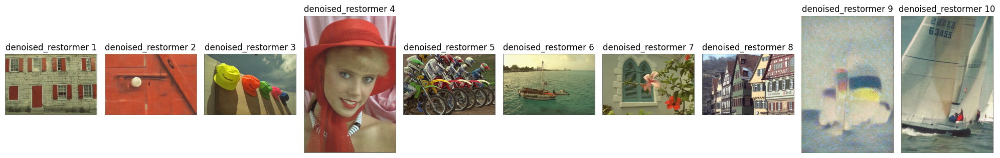

Image 1: RMSE = 16.829472
Image 2: RMSE = 32.737649
Image 3: RMSE = 12.098102
Image 4: RMSE = 15.687080
Image 5: RMSE = 10.081473
Image 6: RMSE = 10.481331
Image 7: RMSE = 10.334040
Image 8: RMSE = 7.586619
Image 9: RMSE = 49.530284
Image 10: RMSE = 20.240067

Average RMSE for all images: 18.5606


In [ ]:
# Get model weights and parameters
parameters = {
    'inp_channels':3,
    'out_channels':3,
    'dim':48,
    'num_blocks':[4,6,6,8],
    'num_refinement_blocks':4,
    'heads':[1,2,4,8],
    'ffn_expansion_factor':2.66,
    'bias':False,
    'LayerNorm_type':'WithBias',
    'dual_pixel_task':False
}
weights, parameters = get_weights_and_parameters(task, parameters)

load_arch = run_path(os.path.join('basicsr', 'models', 'archs', 'restormer_arch.py'))
model = load_arch['Restormer'](**parameters)
model.cuda()

checkpoint = torch.load(weights)
model.load_state_dict(checkpoint['params'])
model.eval()

out_dir = 'demo/sample_images/' + task + '/restored'
os.makedirs(out_dir, exist_ok=True)
extensions = ['jpg', 'JPG', 'png', 'PNG', 'jpeg', 'JPEG', 'bmp', 'BMP']
files = natsorted(glob(os.path.join(input_dir, '*')))

img_multiple_of = 8


# Paths to folders
noisy_folder_path = "/content/drive/MyDrive/Colab Notebooks/ComputerImaging/noisy_images"
original_folder_path = "/content/drive/MyDrive/Colab Notebooks/ComputerImaging/original_images"

# Load noisy and original images in sorted order
noisy_images = load_images_from_folder(noisy_folder_path, prefix="noisy_")
original_images = load_images_from_folder(original_folder_path, prefix="orig_")

# Get sorted lists of filenames
sorted_noisy_filenames = sorted(noisy_images.keys())
sorted_original_filenames = sorted(original_images.keys())


# Create input directory for Restormer
input_dir = 'demo/sample_images/Real_Denoising/degraded'
os.makedirs(input_dir, exist_ok=True)

# Save noisy images to the input directory
for file_name, img in noisy_images.items():
    img = Image.fromarray(img)  # Convert NumPy array to PIL Image before saving
    img.save(os.path.join(input_dir, file_name))

# Model setup and inference
print(f"\n ==> Running {task} with weights {weights}\n ")
rmse_values = []
i = 1

# Plot and save only denoised images
fig, axs = plt.subplots(1, 10, figsize=(20, 4))  # One row: denoised images

with torch.no_grad():
    for noisy_filename, orig_filename in zip(sorted_noisy_filenames, sorted_original_filenames):
        torch.cuda.ipc_collect()
        torch.cuda.empty_cache()

        # Load images
        noisy_img = noisy_images[noisy_filename]
        original_img = original_images[orig_filename]

        # Convert to tensors
        input_ = torch.from_numpy(noisy_img).float().div(255.).permute(2, 0, 1).unsqueeze(0).cuda()

        # Pad input if needed
        h, w = input_.shape[2], input_.shape[3]
        H, W = ((h + img_multiple_of) // img_multiple_of) * img_multiple_of, ((w + img_multiple_of) // img_multiple_of) * img_multiple_of
        padh, padw = H - h if h % img_multiple_of != 0 else 0, W - w if w % img_multiple_of != 0 else 0
        input_ = F.pad(input_, (0, padw, 0, padh), 'reflect')

        # Run model for denoising
        restored = model(input_)
        restored = torch.clamp(restored, 0, 1)
        restored = restored[:, :, :h, :w]
        restored = restored.permute(0, 2, 3, 1).cpu().detach().numpy()
        restored = img_as_ubyte(restored[0])

        # Save denoised image
        cv2.imwrite(os.path.join(out_dir, noisy_filename), cv2.cvtColor(restored, cv2.COLOR_RGB2BGR))

        # Calculate RMSE
        mse = mean_squared_error(original_img.flatten(), restored.flatten())
        rmse = np.sqrt(mse)
        rmse_values.append(rmse)

        # Plot the denoised image
        axs[i - 1].imshow(restored)
        axs[i - 1].set_title(f"denoised_restormer {i}")
        axs[i - 1].axis("off")
        i += 1

    plt.tight_layout()
    plt.show()

# Display the result
for i in range(1, 11):
    # Display RMSE for each image
    print(f"Image {i}: RMSE = {rmse_values[i-1]:.6f}")
average_rmse = np.mean(rmse_values)
print(f"\nAverage RMSE for all images: {average_rmse:.4f}")


In [ ]:
!pip install nbconvert >/dev/null
!apt-get install texlive texlive-xetex texlive-latex-extra pandoc >/dev/null

In [ ]:
!jupyter nbconvert --to pdf --PDFExporter.verbose=True "/content/drive/MyDrive/Colab Notebooks/ComputerImaging/Project Image Denoise++/CS510 Mini Project 1: Image Denoise++.ipynb" >/dev/null

[NbConvertApp] Converting notebook /content/drive/MyDrive/Colab Notebooks/ComputerImaging/Project Image Denoise++/CS510 Mini Project 1: Image Denoise++.ipynb to pdf
[NbConvertApp] Support files will be in CS510 Mini Project 1: Image Denoise++_files/
[NbConvertApp] Making directory ./CS510 Mini Project 1: Image Denoise++_files
[NbConvertApp] Writing 128122 bytes to notebook.tex
[NbConvertApp] Building PDF
[NbConvertApp] Running xelatex 3 times: ['xelatex', 'notebook.tex', '-quiet']
[NbConvertApp] Running bibtex 1 time: ['bibtex', 'notebook']
[NbConvertApp] WARNING | bibtex had problems, most likely because there were no citations
[NbConvertApp] PDF successfully created
[NbConvertApp] Writing 2750941 bytes to /content/drive/MyDrive/Colab Notebooks/ComputerImaging/Project Image Denoise++/CS510 Mini Project 1: Image Denoise++.pdf
